In [15]:
%load_ext autoreload
%autoreload 2

import os 
import shutil
import numpy as n
from datetime import date
from matplotlib import pyplot as plt
import time
import napari

os.chdir('/home/ali/packages/s2p-lbm/')

from suite3d.job import Job
from suite3d import lbmio, utils, ui
from suite3d.io import get_tif_tag
from suite3d.io import tiff_utils as tfu
from suite3d import file_utils as flu
import colorcet

from suite3d import nbtools as nbui

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
subjects_dir =   '/mnt/zortex-subjects/'
expt_info = { 
    'subject':         'SS003',
    'date' :          '2024-08-06',
    'expnum' :         [2]}

tifs, si_params, exp_str = flu.find_exp(subjects_dir, **expt_info, verbose=False)

job_params = {    
    # number of channels recorded in the tiff file, typically 30
    'n_ch_tif' : 26,
    # number of planes in the deeper cavity, typically 15
    'cavity_size' : 13,
    # convert from the Scanimage channel ordering to deep-to-shallow ordering
    # in our case, ScanImage channel numbers are in temporal order. 
    'planes' : n.array([ 0,  2,  4,  6,  8, 10, 12, 14,
                        16, 18, 20, 22, 24, 1,  3, 5,  7,9,11, 13, 15,17,19,21]),
    # number of files to use for the initial pass
    'n_init_files' :   4,
    'fuse_shift_override' : 6,
    'subtract_crosstalk' : True,
    'split_tif_size' : 100,
    
    # volume rate in acquisition
    'fs' : flu.get_si_params(tifs[0])['vol_rate'],
    
    '3d_reg' : True,
    'gpu_reg' : True,
    'save_dtype' : "float16",

    'voxel_size_um' : (20, 3.0, 3.0),
    'cell_filt_type' : 'gaussian',
    'npil_filt_xy_um' :  80,
    'cell_filt_xy_um' :  7.5,
    'sdnorm_exp' :  0.80,
}


job_params['fs'] = si_params['vol_rate']

savedir = os.path.join('/mnt/md0/runs', expt_info['subject'], expt_info['date'])
os.makedirs(savedir, exist_ok=True)

# Create the job
job = Job('/mnt/md0/runs',exp_str, tifs = tifs,
          params=job_params, create=True, overwrite=True, verbosity = 3)

Job directory /mnt/md0/runs/s3d-SS003_2024-08-06_2 already exists
Loading job directory for SS003_2024-08-06_2 in /mnt/md0/runs
   Loading dirs 
      Found dir registered_fused_data
      Found dir summary
      Found dir iters
   Loading default params
      Updating param n_ch_tif
      Updating param cavity_size
      Updating param planes
      Updating param n_init_files
      Updating param fuse_shift_override
      Updating param subtract_crosstalk
      Updating param split_tif_size
      Updating param fs
      Updating param 3d_reg
      Updating param gpu_reg
      Updating param save_dtype
      Updating param voxel_size_um
      Updating param cell_filt_type
      Updating param npil_filt_xy_um
      Updating param cell_filt_xy_um
      Updating param sdnorm_exp
   Updated main params file


In [3]:
# job.run_init_pass()

In [4]:
# %%time
# job.register(tifs=job.tifs)

In [5]:
# job.calculate_corr_map()

In [6]:
from suite3d import extension as ext

In [7]:
# corr_map = job.load_corr_map_results()['vmap']
# corr_map_thresh = ext.thresh_mask_corr_map(corr_map, thresh_window_size_pix = 51, corrmap_thresh_pct = 60)

In [8]:
# job.params['peak_thresh'] = 0.000
# job.params['percentile'] = 99
# job.params['activity_thresh'] = 20.0
# job.params['extend_thresh'] = 0.035
# job.params['patch_size_xy'] = (200,200)
# job.params['patch_overlap_xy'] = (20,20)
# job.params['max_iter'] = 1000
# job.params['n_proc_detect'] = 64
# job.segment_rois(vmap = corr_map_thresh)

In [9]:
rois = job.load_segmentation_results()

      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_2/rois/info.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_2/rois/stats.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_2/rois/iscell.npy


In [10]:
# job.compute_npil_masks(stats_dir = job.dirs['rois'])

In [11]:
traces = job.extract_and_deconvolve(stats_dir=job.dirs['rois'],iscell=None)

   Updated main params file
   Movie shape: (24, 2168, 936, 720)
22107
   Extracting 22107 valid cells, and saving cell flags to /mnt/md0/runs/s3d-SS003_2024-08-06_2/rois/iscell_extracted.npy
   Extracting activity
         Will extract in 5 batches of 500
   Saving intermediate results to /mnt/md0/runs/s3d-SS003_2024-08-06_2/rois
   Deconvolving
   Saving to /mnt/md0/runs/s3d-SS003_2024-08-06_2/rois


In [12]:
summary = job.load_summary()

/home/ali/packages/s2p-lbm/suite3d/io/tiff_utils.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax = plt.subplots(figsize=figsize, dpi=dpi)


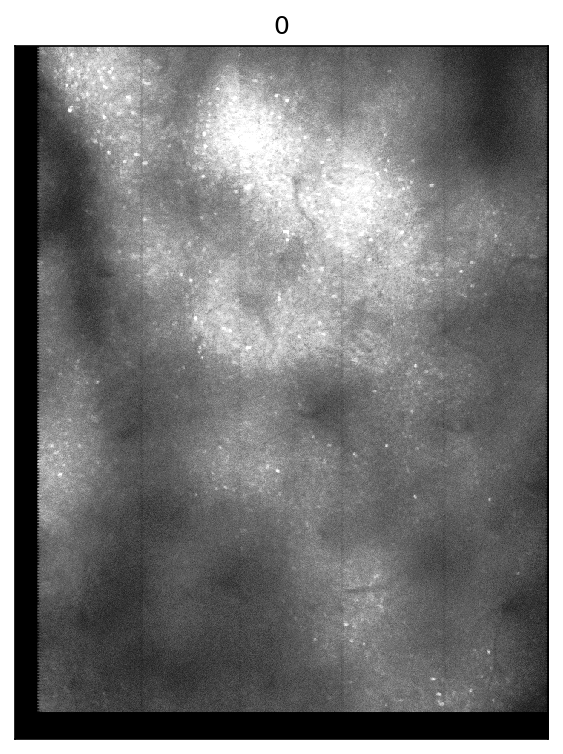

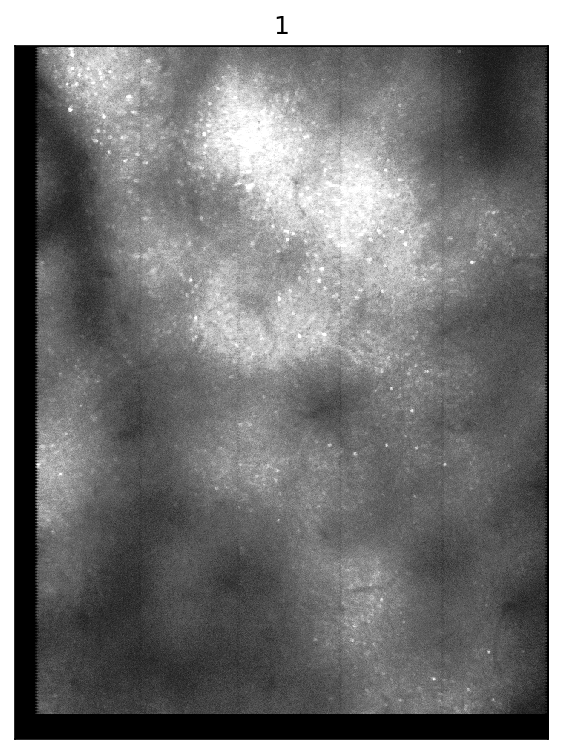

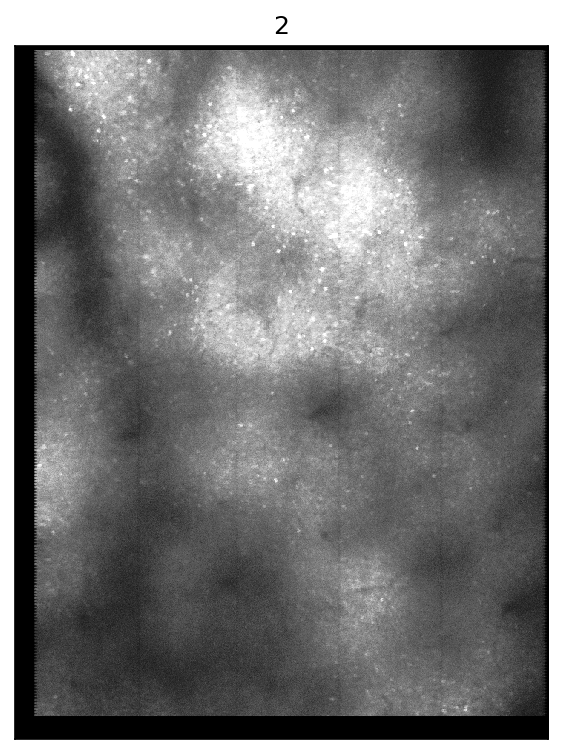

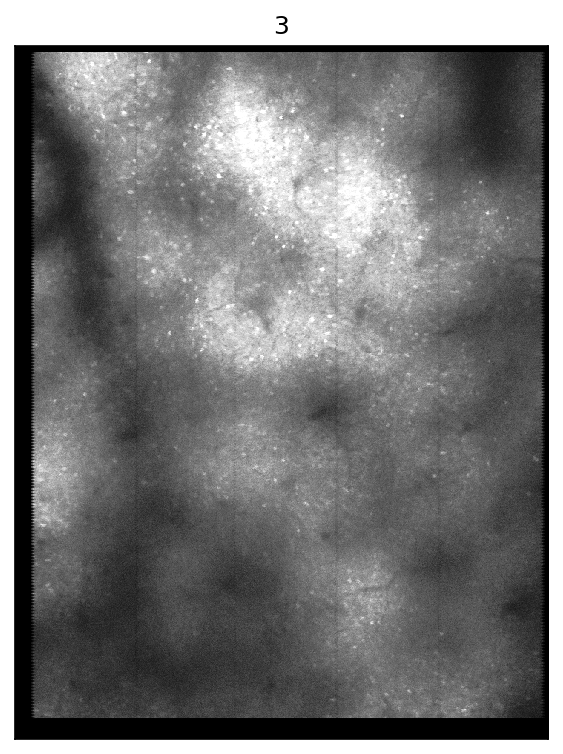

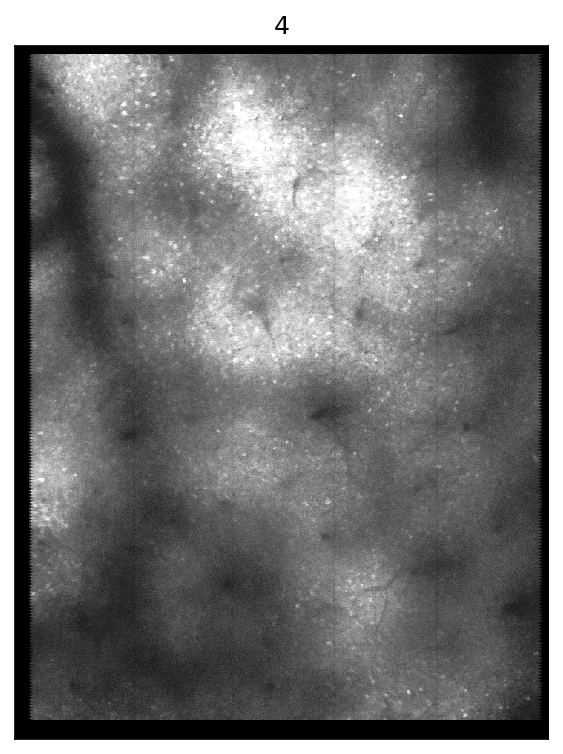

...

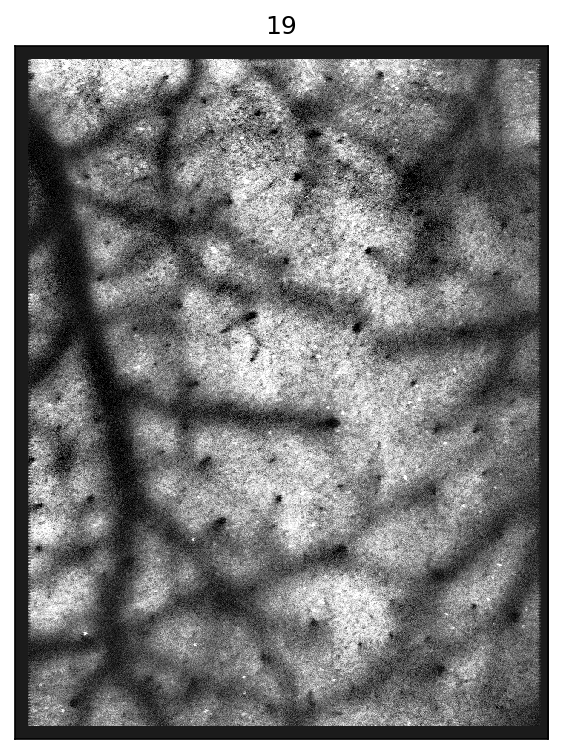

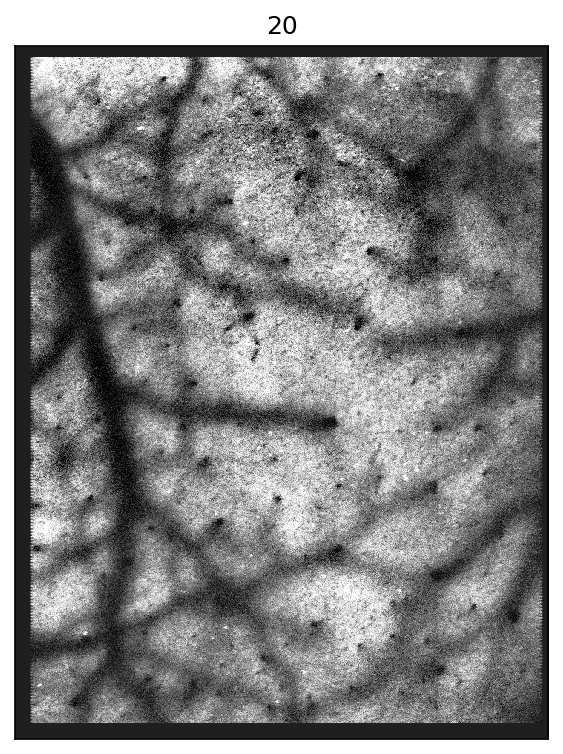

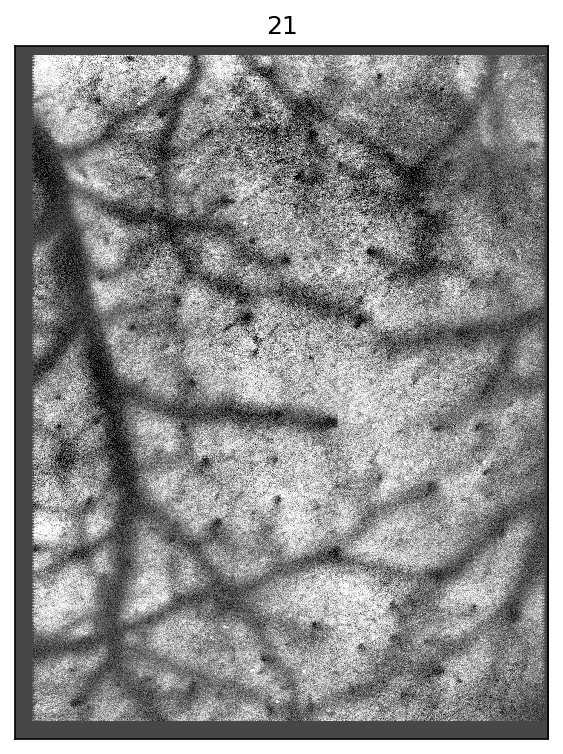

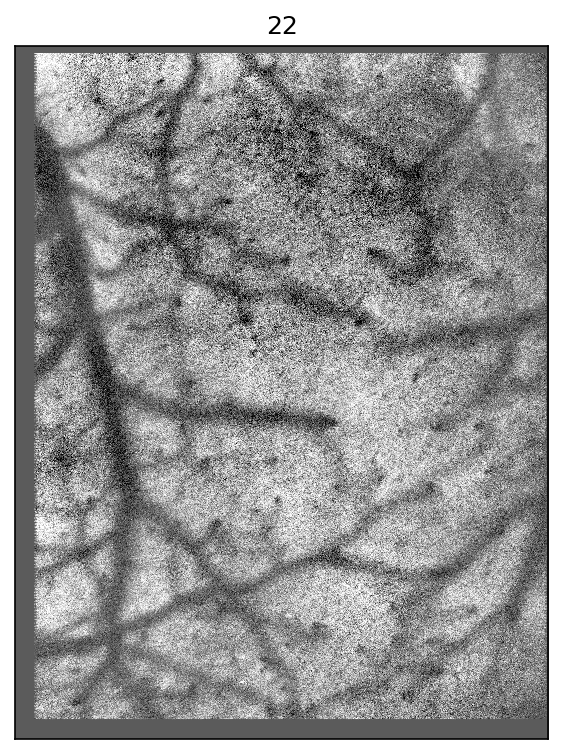

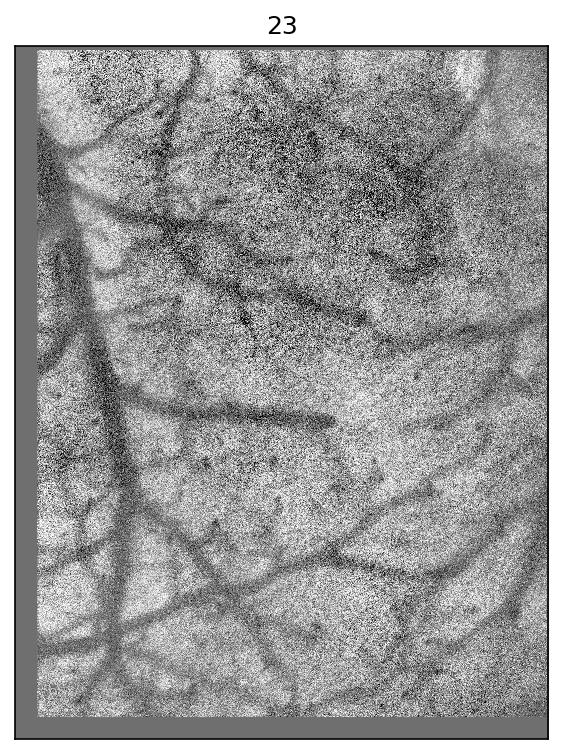

In [13]:
im3d = summary['ref_img_3d']
for i in range(im3d.shape[0]):
    tfu.show_tif(im3d[i])
    plt.title(i)

True